# Space Server Dataset

### Content
>The data consists of 10,000 observations of space taken by the SDSS. Every observation is described by 17 feature columns and 1 class column which identifies it to be either a star, galaxy or quasar.

### Feature Description

>The table results from a query which joins two tables (actuaclly views): "PhotoObj" which contains photometric data and "SpecObj" which contains spectral data.

#### To ease your start with the data you can read the feature descriptions below:

    View "PhotoObj"
    1. objid = Object Identifier
    2. ra = J2000 Right Ascension (r-band)
    3. dec = J2000 Declination (r-band)
     
>Right ascension (abbreviated RA) is the angular distance measured eastward along the celestial equator from the Sun at the March equinox to the hour circle of the point above the earth in question. When paired with declination (abbreviated dec), these astronomical coordinates specify the direction of a point on the celestial sphere (traditionally called in English the skies or the sky) in the equatorial coordinate system

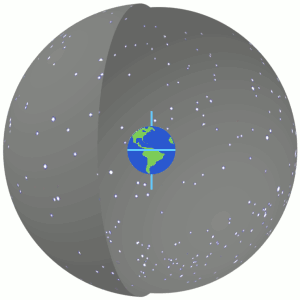

Source: https://en.wikipedia.org/wiki/Right_ascension

    4. u = better of DeV/Exp magnitude fit
    5. g = better of DeV/Exp magnitude fit
    6. r = better of DeV/Exp magnitude fit
    7. i = better of DeV/Exp magnitude fit
    8. z = better of DeV/Exp magnitude fit
    The Thuan-Gunn astronomic magnitude system. u, g, r, i, z represent the response of the 5 bands of the telescope.

Further education: https://www.astro.umd.edu/~ssm/ASTR620/mags.html

     9 . run = Run Number
    10. rereun = Rerun Number
    11. camcol = Camera column
    12. field = Field number

>Run, rerun, camcol and field are features which describe a field within an image taken by the SDSS. A field is basically a part of the entire image corresponding to 2048 by 1489 pixels. A field can be identified by:

>run number, which identifies the specific scan,
the camera column, or "camcol," a number from 1 to 6, identifying the scanline within the run, and
the field number. The field number typically starts at 11 (after an initial rampup time), and can be as large as 800 for particularly long runs.
An additional number, rerun, specifies how the image was processed.
View "SpecObj"

     13. specobjid = Object Identifier
>class = object class (galaxy, star or quasar object)
The class identifies an object to be either a galaxy, star or quasar. This will be the response variable which we will be trying to predict.

    14. redshift = Final Redshift
    15. plate = plate number
    16. mjd = MJD of observation
    17. fiberid = fiber ID

>In physics, redshift happens when light or other electromagnetic radiation from an object is increased in wavelength, or shifted to the red end of the spectrum.

>Each spectroscopic exposure employs a large, thin, circular metal plate that positions optical fibers via holes drilled at the locations of the images in the telescope focal plane. These fibers then feed into the spectrographs. Each plate has a unique serial number, which is called plate in views such as SpecObj in the CAS.

>Modified Julian Date, used to indicate the date that a given piece of SDSS data (image or spectrum) was taken.

>The SDSS spectrograph uses optical fibers to direct the light at the focal plane from individual objects to the slithead. Each object is assigned a corresponding fiberID.

Further information on SDSS images and their attributes:

http://www.sdss3.org/dr9/imaging/imaging_basics.php

http://www.sdss3.org/dr8/glossary.php

# We will start our Analysis in importing the required libraries


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("skyserver.csv")
df

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,STAR,-0.000009,3306,54922,491
1,1.237650e+18,183.598371,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,STAR,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,GALAXY,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,STAR,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,STAR,0.000590,3306,54922,512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.237650e+18,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,301,3,161,5.033450e+17,GALAXY,0.027583,447,51877,246
9996,1.237650e+18,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,301,3,162,5.033400e+17,GALAXY,0.117772,447,51877,228
9997,1.237650e+18,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,301,3,162,8.222620e+18,STAR,-0.000402,7303,57013,622
9998,1.237650e+18,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,301,3,163,5.033400e+17,GALAXY,0.014019,447,51877,229


# EDA:

##### LETS FIND THE NULL VALUES IN THE DATASET

In [3]:
df.isna().sum()

objid        0
ra           0
dec          0
u            0
g            0
r            0
i            0
z            0
run          0
rerun        0
camcol       0
field        0
specobjid    0
class        0
redshift     0
plate        0
mjd          0
fiberid      0
dtype: int64

>there is no null values in the data next in the pipeline is lets identify which are all the colums have non numeric values.

In [4]:
cols = df.columns
num_cols = df._get_numeric_data().columns

non_numeric_data =list(set(cols) - set(num_cols))
non_numeric_data

['class']

In [5]:
df["class"].unique()

array(['STAR', 'GALAXY', 'QSO'], dtype=object)

In [6]:
df["class"].value_counts()

GALAXY    4998
STAR      4152
QSO        850
Name: class, dtype: int64

#                                                         GALAXY

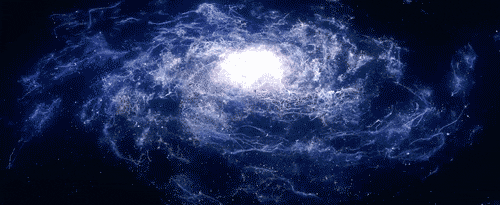

#                                                         STARS

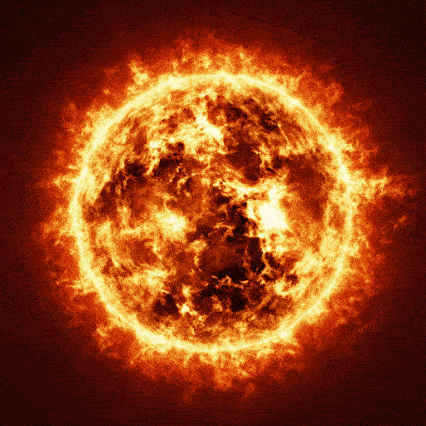

#                                                         QUASARS

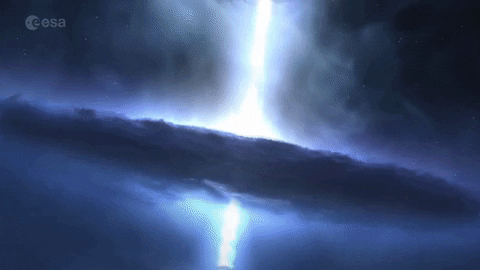

# Encoding the Data with Label Encoder converting all the Non-Numerical data into numeric values.

In [7]:
from sklearn.preprocessing import LabelEncoder
LE= LabelEncoder()
df["class"]=LE.fit_transform(df["class"])

df["class"].unique()

array([2, 0, 1])

In [8]:
df["class"].value_counts() #Galaxy=0 , Star=2 , Quasar=1

0    4998
2    4152
1     850
Name: class, dtype: int64

# Lets see the Correlation.

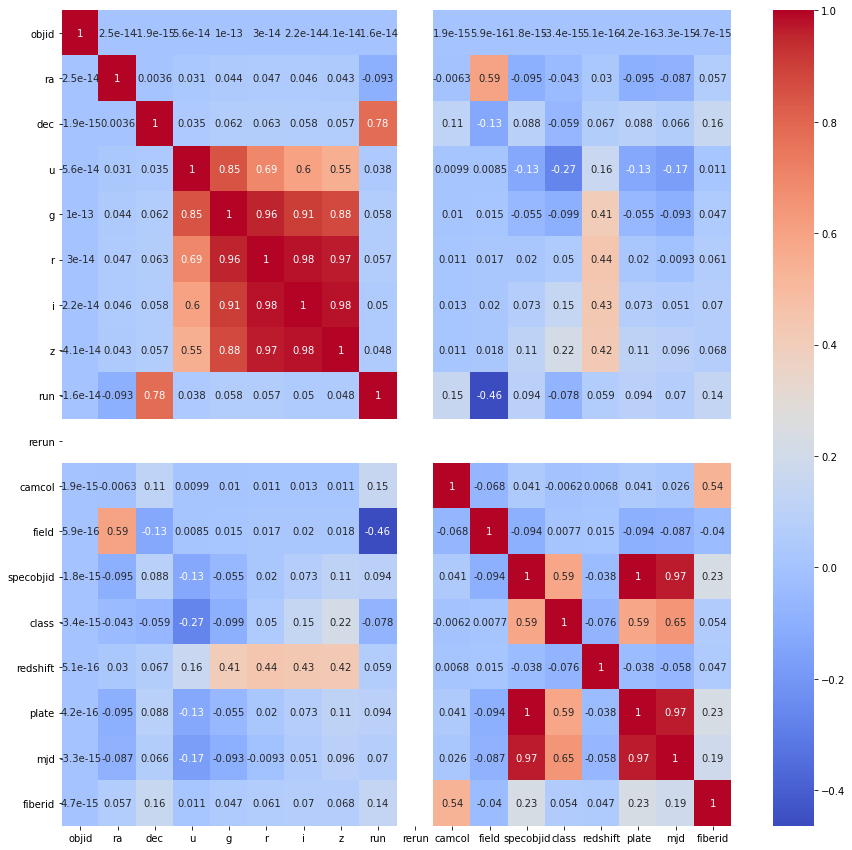

In [9]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot = True, cmap = "coolwarm")
plt.show()

In [10]:
df["rerun"].value_counts()

301    10000
Name: rerun, dtype: int64

>From above we can see that rerun has no correlation with the complete DataSet since there is only one unique value so we will remove rerun from DataSet

In [11]:
df.columns

Index(['objid', 'ra', 'dec', 'u', 'g', 'r', 'i', 'z', 'run', 'rerun', 'camcol',
       'field', 'specobjid', 'class', 'redshift', 'plate', 'mjd', 'fiberid'],
      dtype='object')

In [12]:
df=df.loc[:,['objid', 'ra', 'dec', 'u', 'g', 'r', 'i', 'z', 'run', 'camcol',
       'field', 'specobjid', 'redshift', 'plate', 'mjd', 'fiberid', 'class']]

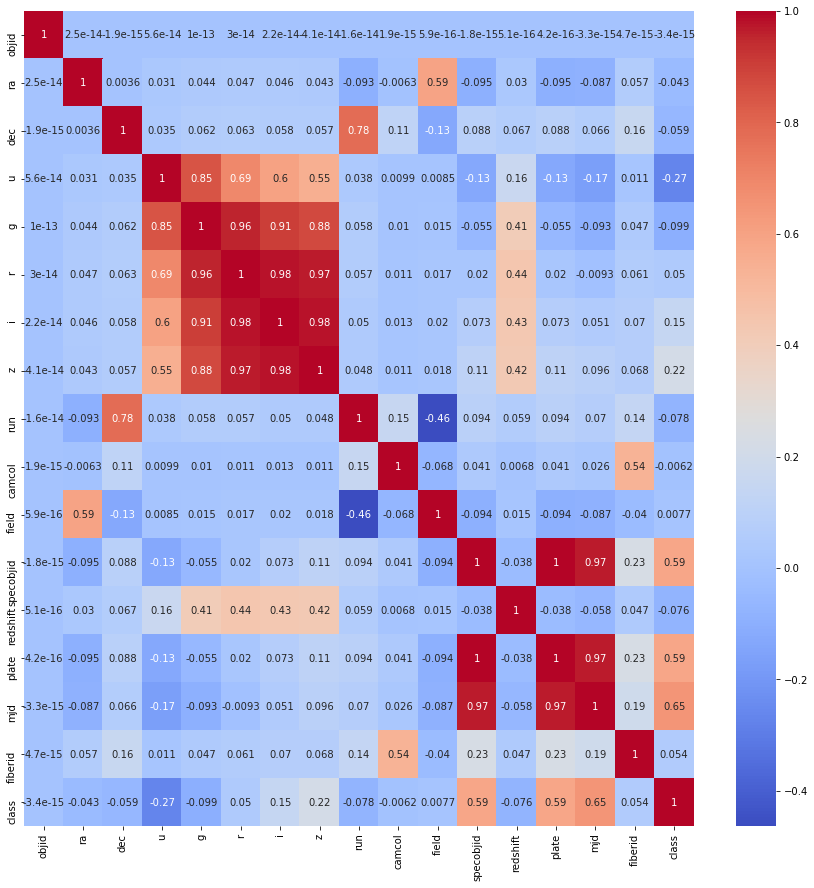

In [13]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot = True, cmap = "coolwarm")
plt.show()

# Key observation:
    4. u = better of DeV/Exp magnitude fit
    5. g = better of DeV/Exp magnitude fit
    6. r = better of DeV/Exp magnitude fit
    7. i = better of DeV/Exp magnitude fit
    8. z = better of DeV/Exp magnitude fit
The Thuan-Gunn astronomic magnitude system. u, g, r, i, z represent the response of the 5 bands of the telescope.
 
The above 5 have more corelation with each other and

     13. specobjid = Object Identifier
     14. redshift = Final Redshift
     15. plate = plate number
     16. mjd = MJD of observation
     17. fiberid = fiber ID

Also these variables have more corelation with each other, which means as per the previous explanation these feild in these two groups are dependent on each other since it has more correlation and also lets further see the correlation with the target variable.

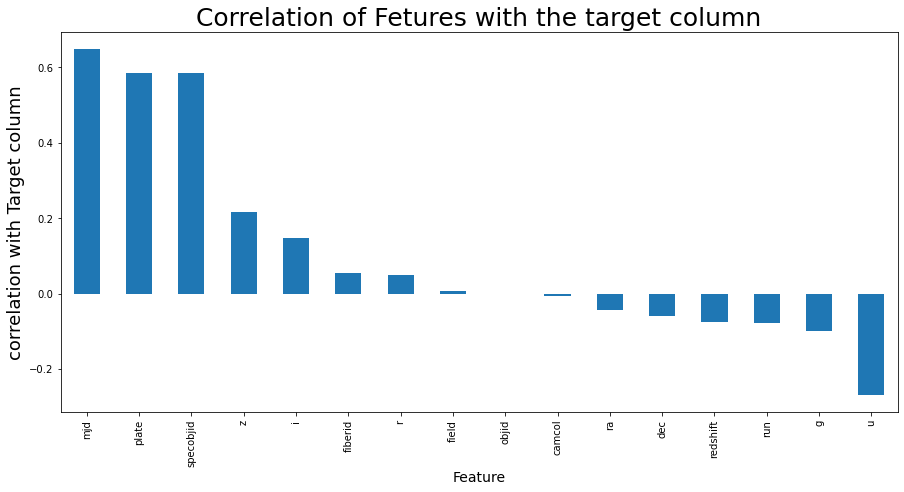

In [14]:
plt.figure(figsize=(15,7))
df.corr()["class"].sort_values(ascending=False).drop(["class"]).plot.bar()
plt.xlabel("Feature", fontsize= 14)
plt.ylabel("correlation with Target column", fontsize = 18)
plt.title("Correlation of Fetures with the target column", fontsize=25)
plt.show()

In [15]:
print("KEY OBSERVTIONS:\n",
      round(df.corr()["class"].sort_values(ascending=False).drop(["class"]),4))

KEY OBSERVTIONS:
 mjd          0.6488
plate        0.5855
specobjid    0.5855
z            0.2158
i            0.1468
fiberid      0.0536
r            0.0496
field        0.0077
objid       -0.0000
camcol      -0.0062
ra          -0.0432
dec         -0.0589
redshift    -0.0755
run         -0.0782
g           -0.0992
u           -0.2690
Name: class, dtype: float64


In [16]:
df["objid"].value_counts()

1.237650e+18    10000
Name: objid, dtype: int64

### From above we can see the objid has no correlation with the target variable and also the corelation with the other variable is lesser so we will drop objid

In [17]:
df.drop("objid", axis = 1, inplace = True)

### Lets also further see the mean median and Max values in the data

In [18]:
des=pd.DataFrame(df.describe())
des.iloc[[1,5,6,7]]

,ra,dec,u,g,r,i,z,run,camcol,field,specobjid,redshift,plate,mjd,fiberid,class
mean,175.529987,14.836148,18.619355,17.371931,16.840963,16.583579,16.422833,981.0348,3.6487,302.3801,1.645022e+18,0.143726,1460.9864,52943.5333,353.0694,0.9154
50%,180.394514,0.404166,18.853095,17.495135,16.858770,16.554985,16.389945,756.0000,4.0000,299.0000,4.966580e+17,0.042591,441.0000,51997.0000,351.0000,1.0000
75%,201.547279,35.649397,19.259232,18.010145,17.512675,17.258550,17.141447,1331.0000,5.0000,414.0000,2.881300e+18,0.092579,2559.0000,54468.0000,510.0000,2.0000
max,260.884382,68.542265,19.599900,19.918970,24.802040,28.179630,22.833060,1412.0000,6.0000,768.0000,9.468830e+18,5.353854,8410.0000,57481.0000,1000.0000,2.0000


### Key Observation:
    The Difference between the mean and median(50%) is not near mean is lesser tham the median which means data has skewness and outliers.
    Let visualize the same in following steps. 

In [19]:
gal1="#1c3355"
gal2="#4576c0"
gal3="#6991cc"
gal4="#8eacd8"
gal5="#d7e1f1"

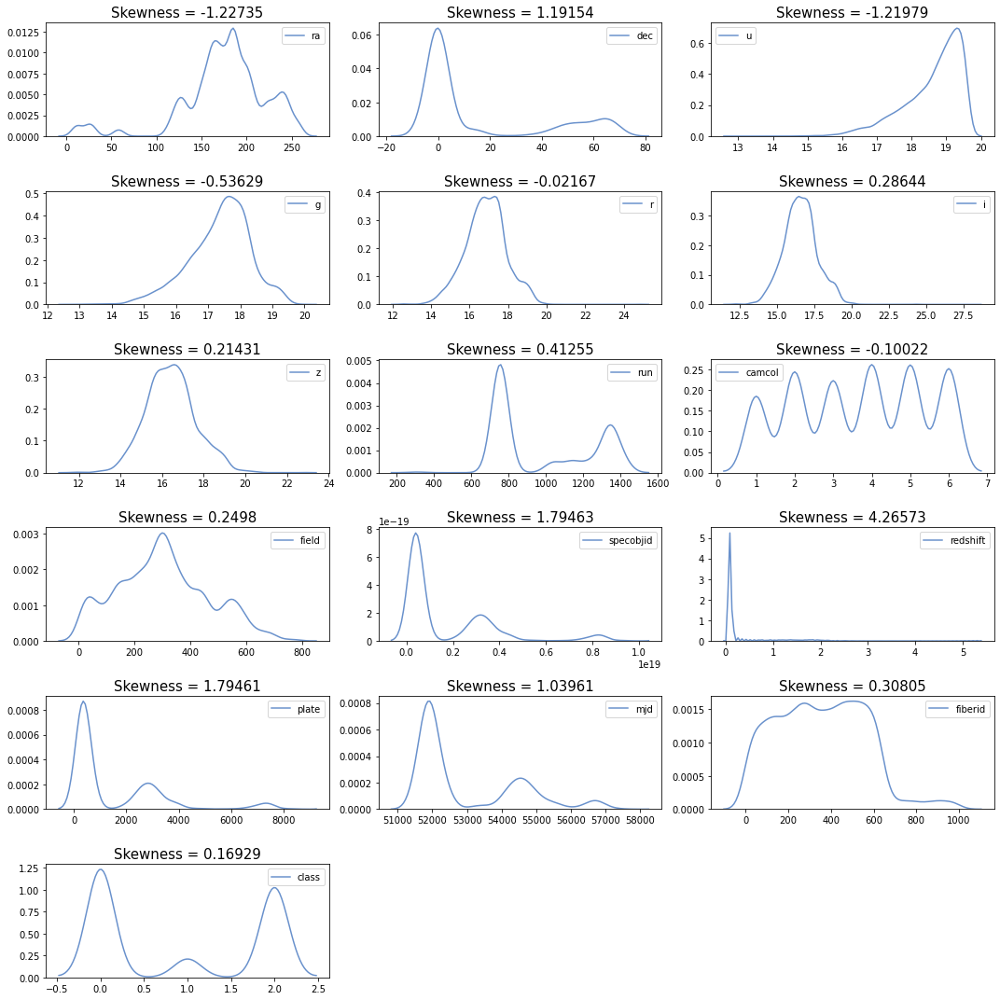

In [20]:
plt.figure(figsize=(15,15))
collist = df.columns.values
for i in range (0, len(collist)):
    plt.subplot(6,3,i+1)         
    sns.kdeplot(df[collist[i]], color = gal3)
    plt.title(f"Skewness = {round(df[collist[i]].skew(),5)}",fontsize=15)
    plt.tight_layout()

In [21]:
skewness=[]
for i in df.skew().values:
    skewness.append(i)
    
df_skewness= pd.DataFrame({"Feature_names": collist,"Skew": skewness})
df_skewness= df_skewness.sort_values(by="Skew", ascending=False, ignore_index= True)


skew_postive_row= []
skew_negative_row=[]
for index, row in df_skewness.iterrows():
    if row['Skew']>0.49:
        skew_postive_row.append(row['Feature_names'])
    elif row['Skew']< -0.49:
        skew_negative_row.append(row['Feature_names'])
        
df_skewness
 

,Feature_names,Skew
0,redshift,4.265729
1,specobjid,1.794627
2,plate,1.794609
3,dec,1.191544
4,mjd,1.039610
5,run,0.412555
6,fiberid,0.308053
7,i,0.286442
8,field,0.249795
9,z,0.214313


In [22]:
print("\n\nFeature names with Skewness is present more than +/-0.5 as follows:\n","\n\nPostive Skewed data:\n",
      skew_postive_row,"\n\nnegative Skewed data:\n", skew_negative_row)       



Feature names with Skewness is present more than +/-0.5 as follows:
 

Postive Skewed data:
 ['redshift', 'specobjid', 'plate', 'dec', 'mjd'] 

negative Skewed data:
 ['g', 'u', 'ra']


# Skewness Removal


BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA


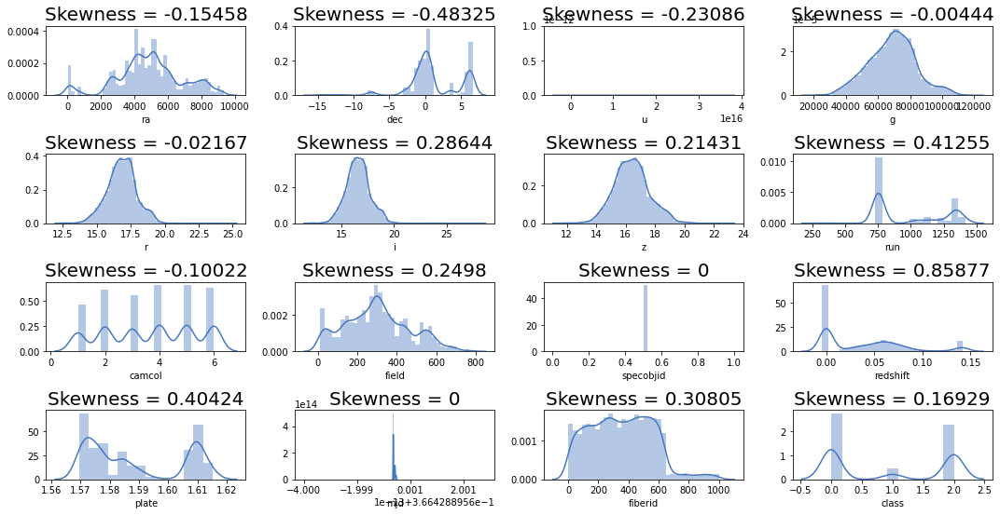

In [23]:
DF=df

from scipy.stats import yeojohnson

for i in skew_postive_row:
    DF[i]= yeojohnson(DF[i])[0]
for i in skew_negative_row:
    DF[i]= yeojohnson(DF[i])[0]   
    
print("BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA")
plt.figure(figsize=(15,15))
for i in range (0, len(collist)):
    plt.subplot(8,4,i+1)
    plt.title(f"Skewness = {round(DF[collist[i]].skew(),5)}",fontsize=20)         
    sns.distplot(DF[collist[i]], color = gal2)
    plt.tight_layout() 

In [24]:
df=DF

# Lets Identify the outliers and remove them.

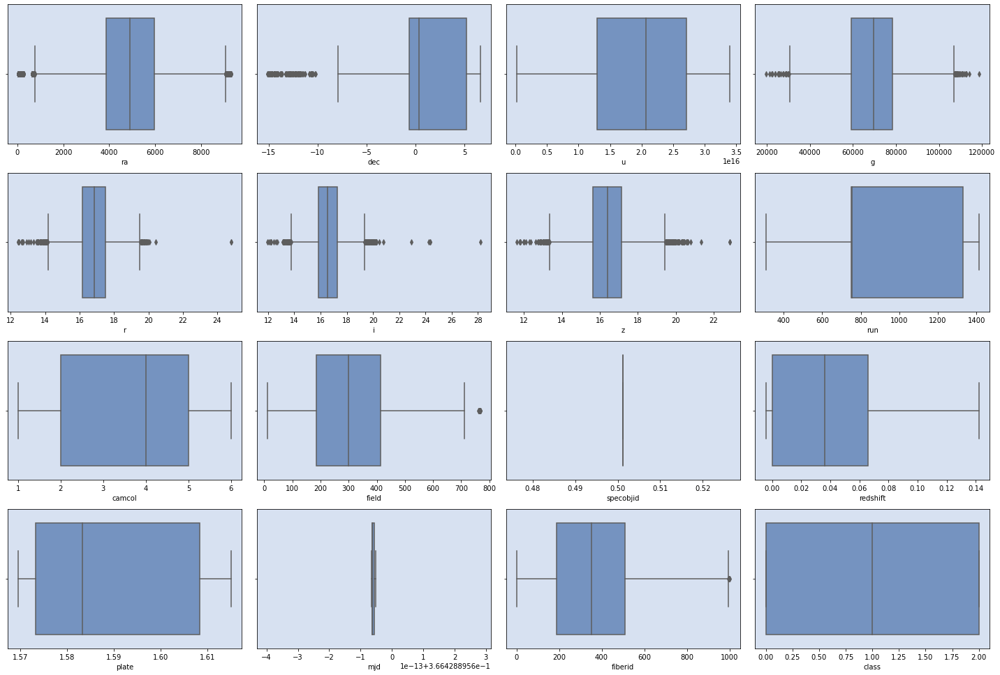

In [25]:
plt.figure(figsize=(20,50))
collist = df.columns.values
for i in range (0, len(collist)):
    plt.subplot(15,4,i+1)
    ax=sns.boxplot(df[collist[i]], color = gal3 , orient = "h")
    ax.set_facecolor(gal5)
    plt.tight_layout()

# Key Observation:
    Outliers are present in the dataset. Lets try removing them without loosing more data

In [26]:
from scipy.stats import zscore
import numpy as np
z= np.abs(zscore(df))
threshold= 3
df_new = df[(z < 3).all(axis=1)]

In [27]:
print(f"Orginal Data {df.shape}\nAfter Removing outliers {df_new.shape}\nThe percentage of data loss {((1000-0)/1000)*100}%")

Orginal Data (10000, 16)
After Removing outliers (0, 16)
The percentage of data loss 100.0%


### loss of data is 100% in Z-Scorre method so we try with IQR mothod

In [28]:
Q1=df.quantile(0.25)
Q3=df.quantile(0.75)
IQR=Q3-Q1

df_new1=df[~((df<(Q1-1.5*IQR))|(df>(Q3+1.5*IQR))).any(axis=1)]
df_new1

,ra,dec,u,g,r,i,z,run,camcol,field,specobjid,redshift,plate,mjd,fiberid,class
0,5060.373178,0.086627,3.128568e+16,62479.726380,15.94699,15.50342,15.22531,752,4,267,0.501266,-0.000009,1.610327,0.366429,491,2
1,5063.574723,0.128484,1.816945e+16,65097.404202,16.67637,16.48922,16.39150,752,4,267,0.501266,-0.000055,1.575417,0.366429,541,2
2,5067.483794,0.120238,2.946592e+16,81600.117109,17.47428,17.08732,16.80125,752,4,268,0.501266,0.079323,1.571963,0.366429,513,0
3,5076.579791,0.048940,9.697203e+15,56158.409351,16.16116,15.98233,15.90438,752,4,269,0.501266,-0.000111,1.610327,0.366429,510,2
4,5077.189821,0.098577,8.305123e+15,51625.993936,16.43869,16.55492,16.61326,752,4,269,0.501266,0.000589,1.610327,0.366429,512,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2835.694593,6.003302,2.019145e+16,69147.141602,16.91508,16.68305,16.50570,1345,3,161,0.501266,0.024762,1.583724,0.366429,246,0
9996,2835.309108,6.008773,1.387787e+16,68630.045535,17.07692,16.71661,16.69897,1345,3,162,0.501266,0.077183,1.583724,0.366429,228,0
9997,2844.512837,6.008593,1.939050e+16,74260.463230,17.51872,17.43302,17.42048,1345,3,162,0.501266,-0.000402,1.614557,0.366429,622,2
9998,2841.695582,6.012160,2.110140e+16,76558.621839,17.53152,17.36284,17.13988,1345,3,163,0.501266,0.013261,1.583724,0.366429,229,0


In [29]:
print(f"Orginal Data {df.shape}\nAfter Removing outliers {df_new1.shape}\nThe percentage of data loss {((10000-9232)/10000)*100}%")

Orginal Data (10000, 16)
After Removing outliers (9230, 16)
The percentage of data loss 7.68%


### In IQR Method also loss of data is higher we will continue the pipeline with outliers present in the data.

# MultiVariate Analysis:

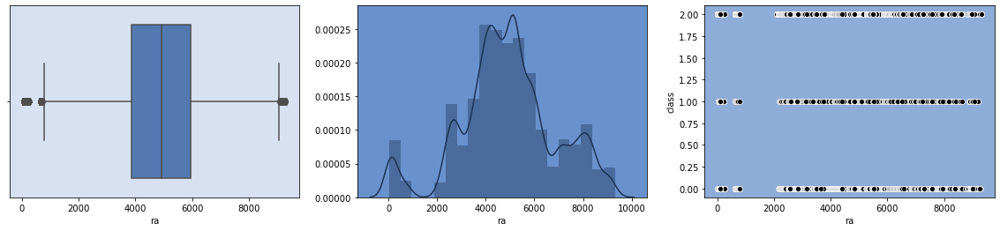

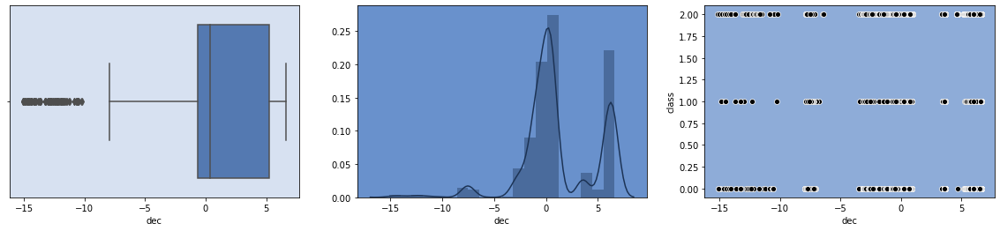

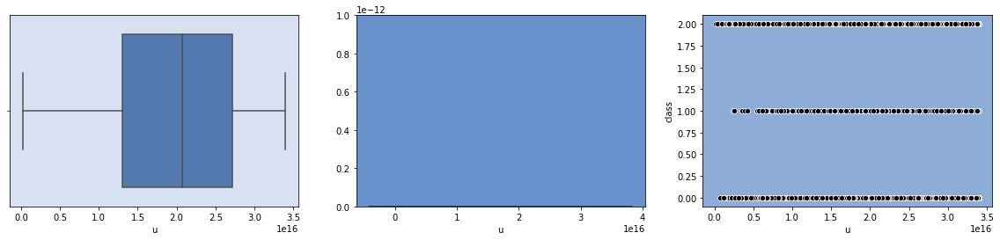

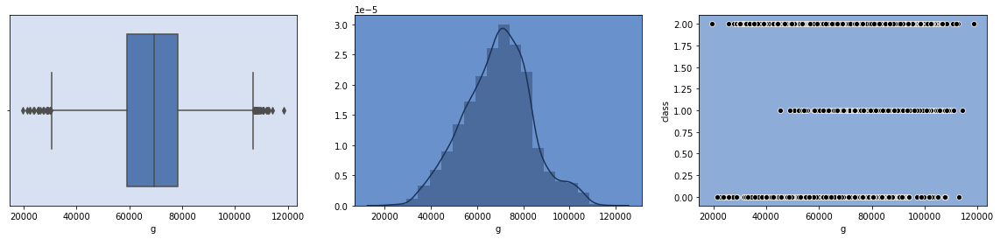

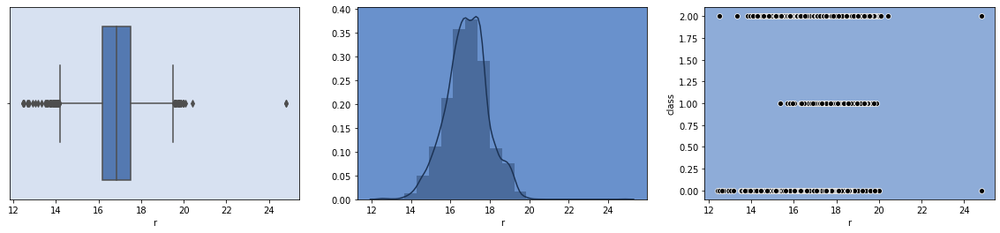

...

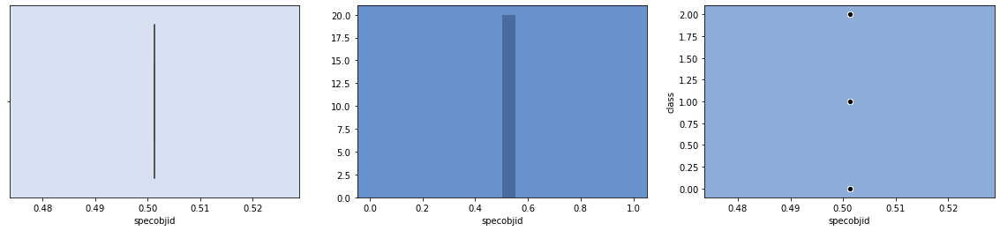

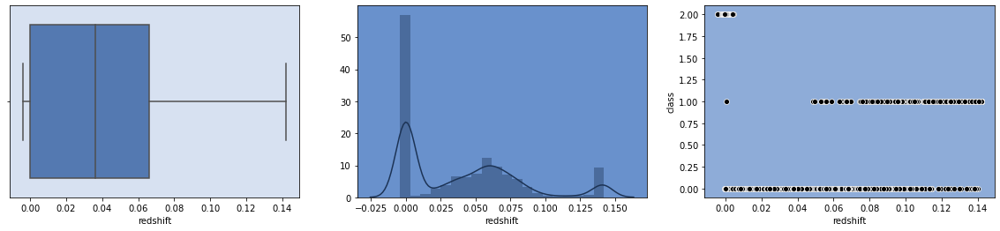

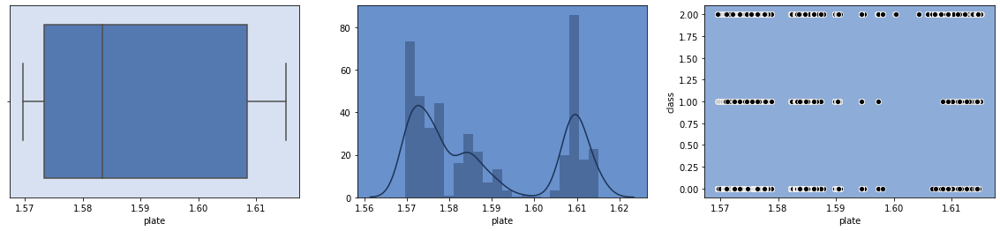

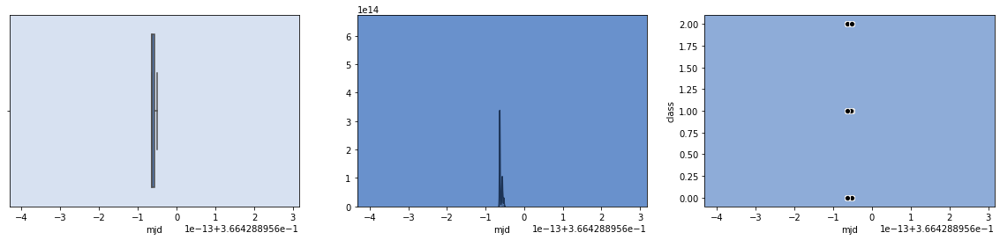

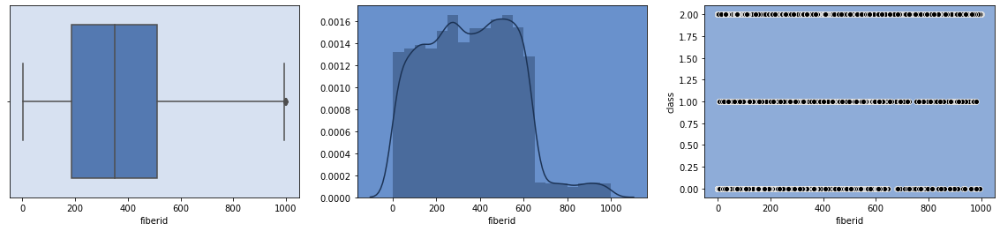

In [30]:
target_variable_1 = "class"
feature_variable = ['ra', 'dec', 'u', 'g', 'r', 'i', 'z', 'run', 'camcol',
       'field', 'specobjid', 'redshift', 'plate', 'mjd', 'fiberid']


def num_plots(feature_name):
    fig, axs = plt.subplots(1, 3, figsize=(20, 4))
    a1=sns.boxplot(x=df[feature_name], ax=axs[0], color=gal2)
    a1.set_facecolor(gal5)
    a2=sns.distplot(df[feature_name], bins=20, kde=True, ax=axs[1],color=gal1)
    a2.set_facecolor(gal3)
    a3=sns.scatterplot(data=df, x=feature_name, y=target_variable_1, ax=axs[2], color="k")
    a3.set_facecolor(gal4)
    plt.show()
    
for i in feature_variable:
    num_plots(i)  

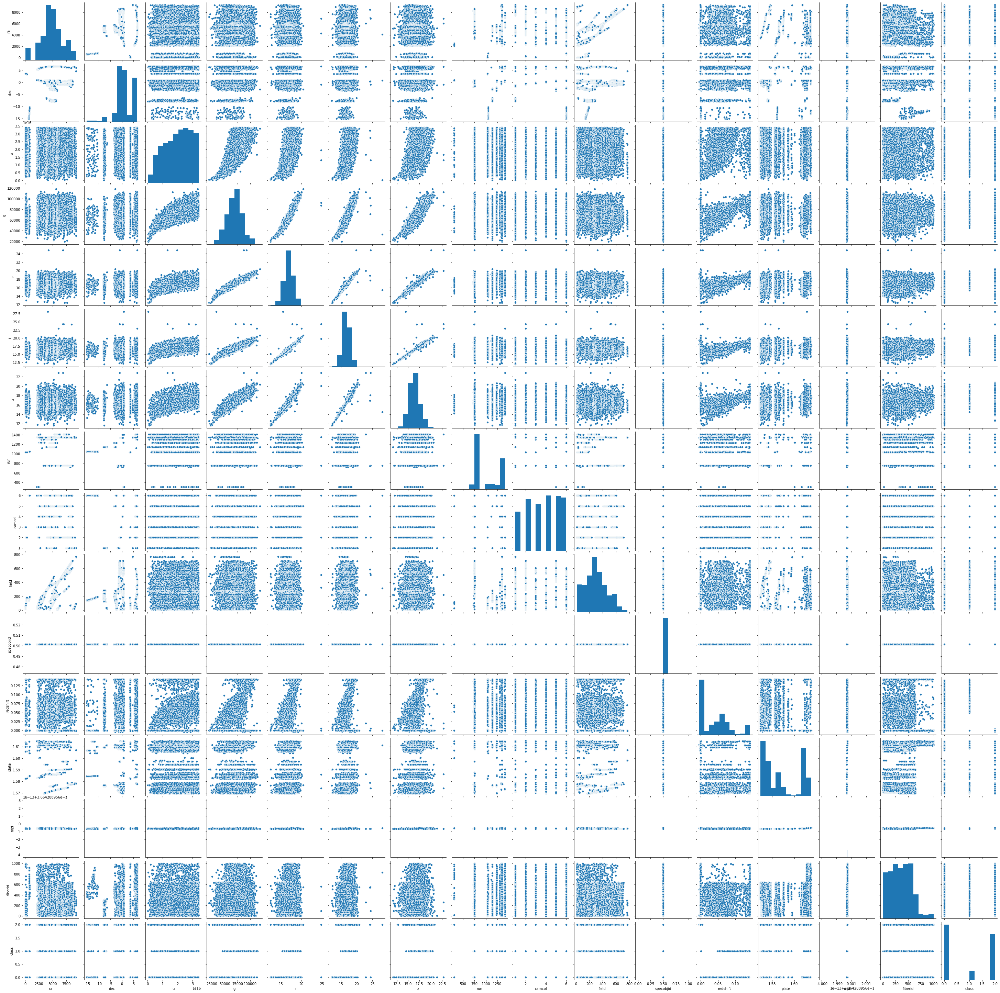

In [31]:
 sns.pairplot(df)

> From Above Two observation we can see the columns which has corelation with each other have high merging points in scatter plot now lets build our model lets find out what is Star Quasar and Galaxy.

##### Scaling the DataSet Before proceeding for training

In [32]:
x=df.drop(["class"], axis = 1)
y=df['class']
from sklearn.preprocessing import StandardScaler
sc= StandardScaler()

x=sc.fit_transform(x)

# Filtering best parameters for the model

In [33]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


accu = 0
for i in range(0,1000):
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = .25, random_state = i)
    mod = GaussianNB()
    mod.fit(x_train,y_train)
    y_pred = mod.predict(x_test)
    tempacc = accuracy_score(y_test,y_pred)
    if tempacc> accu:
        accu= tempacc
        best_rstate=i 

print(f"Best Accuracy {accu*100} found on randomstate {best_rstate}") 

Best Accuracy 99.03999999999999 found on randomstate 260


In [34]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = .25, random_state = best_rstate)

In [35]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict, StratifiedKFold 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier,GradientBoostingClassifier
from sklearn.metrics import roc_curve, roc_auc_score 
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn import metrics
import xgboost as xgb

# Shortlisting Promising Classification Models.

In [39]:
def C_V(estimator, x_train, y_train, cv=10, verbose=True):
   
    scoring = {"accuracy": "accuracy",
               "precision": "precision_weighted",
               "recall": "recall_weighted",
               "f1": "f1_weighted"}
    scores = cross_validate(estimator, x_train, y_train, cv=cv, scoring=scoring)
    
    accuracy, accuracy_std = scores['test_accuracy'].mean(), scores['test_accuracy'].std()
    precision, precision_std = scores['test_precision'].mean(),scores['test_precision'].std()
    recall, recall_std = scores['test_recall'].mean(), scores['test_recall'].std()
    f1, f1_std = scores['test_f1'].mean(), scores['test_f1'].std()

    
    result = {
        "Accuracy": accuracy,
        "Accuracy std": accuracy_std,
        "Precision": precision,
        "Precision std": precision_std,
        "Recall": recall,
        "Recall std": recall_std,
        "f1": f1,
        "f1 std": f1_std,
    }
    
    if verbose:
        print(f"Accuracy: {accuracy} - (std: {accuracy_std})")
        print(f"Precision: {precision} - (std: {precision_std})")
        print(f"Recall: {recall} - (std: {recall_std})")
        print(f"f1: {f1} - (std: {f1_std})")

    return result

In [37]:
models = [GaussianNB(), KNeighborsClassifier(), RandomForestClassifier(random_state=42),
          DecisionTreeClassifier(random_state=42), ExtraTreeClassifier(random_state=42), 
          AdaBoostClassifier(random_state=42), GradientBoostingClassifier(random_state=42), 
          xgb.XGBClassifier()]

model_names = ["Naive Bayes Gaussian", "K Neighbors Classifier", "Random Forest",
               "Decision Tree", "Extra Tree", "Ada Boost", 
               "Gradient Boosting", "XGBoost"]

In [41]:
accuracy = []
precision = []
recall = []
f1 = []

for model in range(len(models)):
    print(f"\n\nStep {model+1} of {len(models)}")
    print(f"............................................................running {model_names[model]}")
    
    clf_scores = C_V(models[model], x_train, y_train)
    
    
    
    accuracy.append(clf_scores["Accuracy"])
    precision.append(clf_scores["Precision"])
    recall.append(clf_scores["Recall"])
    f1.append(clf_scores["f1"])



Step 1 of 8
............................................................running Naive Bayes Gaussian
Accuracy: 0.9806666666666667 - (std: 0.004550946177566912)
Precision: 0.9809605298218074 - (std: 0.004431562134687952)
Recall: 0.9806666666666667 - (std: 0.004550946177566912)
f1: 0.9807424269154487 - (std: 0.004483990449358481)


Step 2 of 8
............................................................running K Neighbors Classifier
Accuracy: 0.9573333333333333 - (std: 0.0071802197428460215)
Precision: 0.9575668827982222 - (std: 0.007099071741301183)
Recall: 0.9573333333333333 - (std: 0.0071802197428460215)
f1: 0.9572827450842301 - (std: 0.007164550970118109)


Step 3 of 8
............................................................running Random Forest
Accuracy: 0.9865333333333333 - (std: 0.0021039645117412777)
Precision: 0.9865363661123178 - (std: 0.0021780651165892928)
Recall: 0.9865333333333333 - (std: 0.0021039645117412777)
f1: 0.9864692054661717 - (std: 0.002095911978367318)


St

In [42]:
classification_result = pd.DataFrame({"Model": model_names,
                                      "accuracy": accuracy,
                                      "precision": precision,
                                      "recall": recall,
                                      "f1": f1})
classification_result.sort_values(by="f1", ascending=False)

,Model,accuracy,precision,recall,f1
7,XGBoost,0.990533,0.990583,0.990533,0.990474
6,Gradient Boosting,0.988667,0.988807,0.988667,0.988662
2,Random Forest,0.986533,0.986536,0.986533,0.986469
3,Decision Tree,0.982933,0.983105,0.982933,0.982973
0,Naive Bayes Gaussian,0.980667,0.980961,0.980667,0.980742
1,K Neighbors Classifier,0.957333,0.957567,0.957333,0.957283
4,Extra Tree,0.932533,0.932916,0.932533,0.932538
5,Ada Boost,0.826267,0.879065,0.826267,0.838076


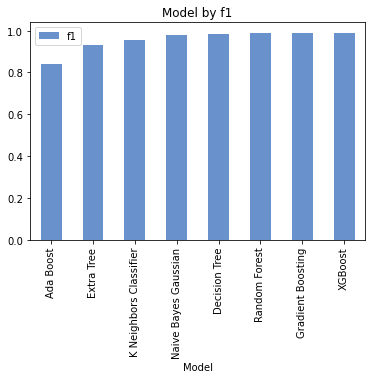

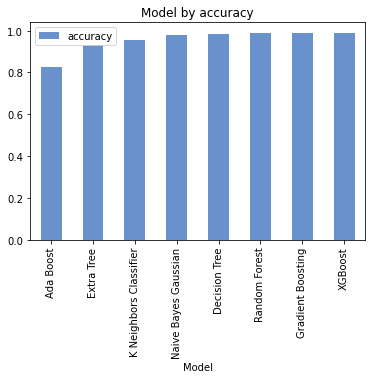

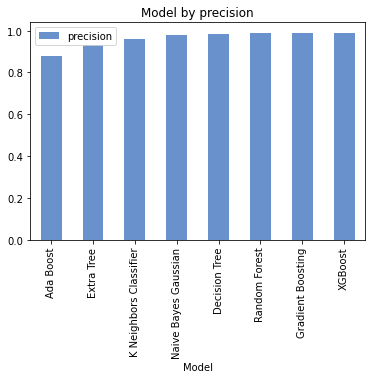

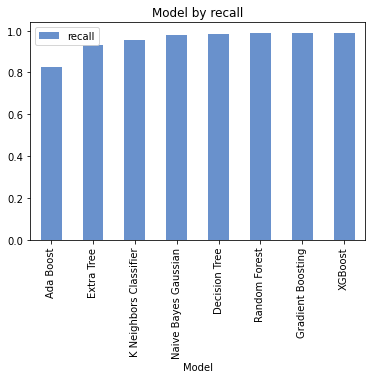

In [43]:
metrics_list = ["f1", "accuracy", "precision", "recall"]

for metric in metrics_list:
    classification_result.sort_values(by=metric).plot.bar("Model", metric, color = gal3)
    plt.title(f"Model by {metric}")
    plt.show()

# Key Observation:
     Among our model we have XGB tops the chart. Lets hypertune XGBost.
     XGB-F1score = 0.99

In [44]:
clf_xgb =  xgb.XGBClassifier(silent=True)
preds = cross_val_predict(clf_xgb, x_train, y_train, cv=5, n_jobs=-1)
clf_xgb.get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': True,
 'base_score': None,
 'booster': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'gamma': None,
 'gpu_id': None,
 'importance_type': 'gain',
 'interaction_constraints': None,
 'learning_rate': None,
 'max_delta_step': None,
 'max_depth': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None,
 'silent': True}

In [45]:
pd.crosstab(y_train, preds, rownames = ['Real'], colnames =['Predicted'])

Predicted,0,1,2
Real,,,
0,3745,22,5
1,40,591,1
2,2,0,3094


In [46]:
print(classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3772
           1       0.96      0.94      0.95       632
           2       1.00      1.00      1.00      3096

    accuracy                           0.99      7500
   macro avg       0.98      0.98      0.98      7500
weighted avg       0.99      0.99      0.99      7500



# HYPER TUNING....


In [47]:
param_grid = [
    {'learning_rate' : [1e-3, 1e-1, 'log-uniform'],
     'n_estimators': [100, 2000],
     'max_depth': [1, 10],
     'min_child_weight': [1, 6.],
     'gamma': [0, 0.5], 
     'subsample':[0.5, 1.], 
     'colsample_bytree': [0.5, 1.] 
    }
 

clf_xgb =  xgb.XGBClassifier(silent=True)

grid_search = GridSearchCV(clf_xgb, param_grid, cv=5,
                           scoring="f1_weighted", verbose=2, n_jobs=-1)

In [48]:
grid_search.fit(x_train, y_train)

Fitting 5 folds for each of 192 candidates, totalling 960 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 401 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 722 tasks      | elapsed: 13.6min
[Parallel(n_jobs=-1)]: Done 960 out of 960 | elapsed:    0.0s finished


[01:51:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:51:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs...
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, silent=True,
                                     subsample=None, tree_method=None,
                                     validate_parameters=None, verbos

In [49]:
grid_search.best_params_

{'colsample_bytree': 1.0,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_child_weight': 1,
 'n_estimators': 2000,
 'subsample': 1.0}

In [50]:
grid_search.best_score_

0.9904900335358835

In [51]:
final_model = grid_search.best_estimator_
preds = cross_val_predict(final_model, x_train, y_train, cv=5, n_jobs=-1)
preds

array([0, 0, 0, ..., 2, 0, 2])

In [52]:
pd.crosstab(y_train, preds, rownames = ['Actual'], colnames =['Predicted'])

Predicted,0,1,2
Actual,,,
0,3744,23,5
1,40,591,1
2,2,0,3094


In [53]:
print(metrics.classification_report(y_train, preds))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3772
           1       0.96      0.94      0.95       632
           2       1.00      1.00      1.00      3096

    accuracy                           0.99      7500
   macro avg       0.98      0.98      0.98      7500
weighted avg       0.99      0.99      0.99      7500



In [54]:
y_pred = final_model.predict(x_test)

pd.crosstab(y_test, y_pred, rownames = ['Actual'], colnames =['Predicted'])

Predicted,0,1,2
Actual,,,
0,1220,5,1
1,5,213,0
2,1,0,1055


In [55]:
print(metrics.classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1226
           1       0.98      0.98      0.98       218
           2       1.00      1.00      1.00      1056

    accuracy                           1.00      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       1.00      1.00      1.00      2500



In [56]:
conf_mx = metrics.confusion_matrix(y_test, y_pred)

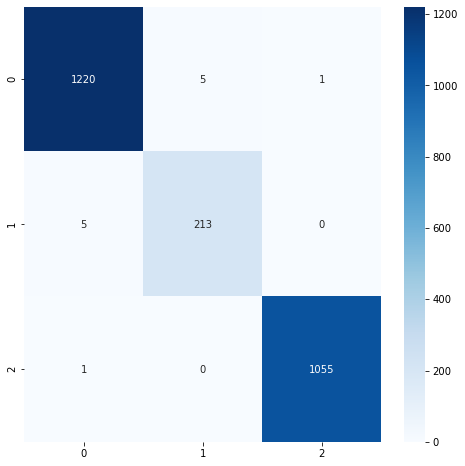

In [57]:
fig = plt.figure(figsize=(8,8))
ax = sns.heatmap(conf_mx, annot=True, fmt="d", 
                 xticklabels=final_model.classes_,
                 yticklabels=final_model.classes_,
                cmap= "Blues")

# We have hypertuned the XGB Classifier and have improved the F1 score

# Summary:

>We started our analysis from EDA Preprocessing-Pipeline. We identified the ‘NaN’ values in the dataset and encoding the target variable "class" into numerical values Galaxy=0 , Star=2 , Quasar=1, post in the pipeline we analysed the mathemetical values like Mean Median and Max values of all the column. We compared every feature variable with the target variable and we analysised the correlation of the same from that we figured out the following feature variables have high postive corelation with the dataset.

                                                  mjd          0.6488
                                                  plate        0.5855
                                                  specobjid    0.5855
                                                  z            0.2158
                                                  
>Further in the preprocessing pipeline we analysed and identified skewness and outliers in the data we removed the skewness by yeojohnson method. But since our data has more outliers present we decided to work with outliers. Post that we saw multivariate analysis and pair plot we also witnessed that the columns which has more correlation the spread of the data points in the scatter plots are lesser and also we compared the same with the target variable.                                               

>We scaled our data using standared scaler and we trained out model after finding the best random_state.
we trained and sortlisted XGB from 9 classification models
and we hyper tuned the XGB after seeing the CV scores. We are further saving our model for further use in production.

### Saving our model


In [58]:
import joblib
joblib.dump(final_model,"sky_server.obj")

['sky_server.obj']

# Conclusion

>This study aims to better understand how astronomers identify the cosmic objects that flots in the space what are all the factors that helps to identify a space objects.
>>The Study and Analysis helps the space reachers to identify the "Stars" "Galaxy" "Quasars" in a Constellation interstellar 